# Assignment 1. Point Operations

<span style="color:orange">Ground Rules for the Assignment: </span>

* <span style="color:lightblue"> You can only use basic functions (matrix operations, input/output image functions, plotters). Anything else, you need to code from scratch (histogram functions, inverting gamma functions, color matting, histogram equalization)</span>
* <span style="color:lightblue"> The code needs to be appropiately commented and should be reproducible; if we cannot re-generate your figures from your code, we will deduct points.</span>
* <span style="color:lightblue">The notebook report should be detailed and include partial and final solutions for each exercise. We grade solely the report; code without report will not be graded, so we encourage that you invest some time on it</span>
* <span style="color:lightblue">Interactive plots are welcome but most important results should be static and generated beforehand</span>
* <span style="color:lightblue">__Remember to remove all plots from the "coding" sections.__ Only the Report should output plots and/or images.</span>


<span style="color:orange">Submission Details</span>

Simply submit this Jupyter Notebook with the report inlined as described below. The notebook should be executed before submission. Name the file as 
```surname1_name1_surname2_name2_assignment1.ipynb```



# Point Operations

Point operations are the simplest kind of image processing transforms. They modify pixel values independently of their location within the image or neighboring values. They are used for simple contrast and brightness enhancements, color adjustments, matting and compression, among other things. In this assignment, we will be learning some of the most common point operators for color images. Remember to use matrix operations whenever possible to obtain efficient code.

In [4]:
# Loading Libraries you will need for the assignment.- Install them in your environment if you haven't done so yet
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy as sp

## 1.1. Tone mapping & Linearization [2 points]

RAW/HDR images (either real or synthetic) usually have a much larger dynamic range than the capabilities
of most displaying devices. We use tone mapping to adapt pixel intensities to the limits of the device that will
display them, maximizing perceived quality. Tone mapping algorithms are designed to adjust the contrast
and brightness of HDR images so that detail in highlights and shadows is preserved when displayed in LDR.

**Gamma Correction.** Display devices like CRTs, LCDs or OLED devices cannot, or are not designed to,
achieve a linear conversion from voltage or intensity to light emitted. In practice, this means that doubling
the value of a pixel would not result in double the light being emitted. In order to solve this issue, each pixel
value is mapped to an exponential function of the type $f(x) = x^\gamma$ , with an encoding gamma of typical value
$\frac{1}{2.2}$. This type of tone mapping is called gamma correction.

**Linearization.** The final product of any digital camera pipeline is a compressed non-linear image, normally
in JPEG format, where tone mapping has already been applied. However, this means intensities have been
mapped with an exponential function. Using linear color for image processing is important because it ensures
that the mathematical operations performed on the image data are consistent with the physics of light and
the way that images are captured and displayed, as light transport is indeed linear.

### _Task_
Implement code to load the ```Ferrari.JPEG``` image into a matrix and invert the function
above to linearize the image back. Assume that the value used for encoding the image was $\gamma = \frac{1}{2.2}$. You can
use ```Image``` to load your images. Try applying other per-pixel functions to
increase brightness (linear multiplications) and contrast enhancement (exponential functions) and showcase
your creations.

In [2]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm
def gamma_correction(img,gamma) :
    return np.clip(img ** (1/gamma), 0, 1)  

def increase_brightness(img,inc):
    return np.clip(img * inc, 0, 1)

def enhance_contrast(img,inc):
    return np.clip(img ** inc, 0, 1)


In [3]:
# Execute your code here
img = Image.open("ferrari.JPG").convert("RGB")
img_arr = np.array(img) / 255.0 

corr_img = gamma_correction(img_arr,2.2)
brighter_img = increase_brightness(corr_img,1.7)
enhanced_img = enhance_contrast(corr_img,1.2)

###  <span style="color:orange"> _Report_ </span>
<span style="color:orange"> _Report your results below. Include the linerized image, and experiments with contrast and brightness enhancements. Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive._ </span>

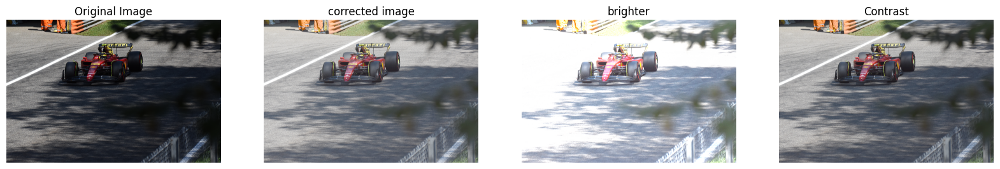

In [4]:
fig, axes = plt.subplots(1, 4, figsize=(20, 15))

axes[0].imshow(img_arr)
axes[0].set_title("Original Image")
axes[0].axis("off")  

axes[1].imshow(corr_img)
axes[1].set_title("corrected image")
axes[1].axis("off")

axes[2].imshow(brighter_img)
axes[2].set_title("brighter")
axes[2].axis("off")  

axes[3].imshow(enhanced_img)
axes[3].set_title("Contrast")
axes[3].axis("off")

plt.show()

__Gamma Correction__

In general gamma correction is used to correct the image so that when displayed on a display, i will be rendered in the same way as it was taken by the camera. Depending on how much light hits the camera, the photo taken can be visualized very diffrently and furthermore can be displayed brighter or darker depending on the screen we are visualizing it on.

To apply gamma correction so that the image is visualized in the correct way the approach is to map every pixel of the image to a new value calculate by applying an exponential function to it. This gives us the possibility of correctly visualizing the different parts of the image that normally are visualized either too bright or too dark. In our case everypixel is elevated to the 1/2.2.

__Brightness and Contrast enhancement__
As explain the result of a camera image is stored and compress as a non-linear image which means that intensities have been mapped with anexponential function. It is insted important to work with linearity to preserve the right color tones, brightness and contrast. In order to do this when we deal with brightnees, in order to make the image brighter we can multiply every single pixel by a certain value, this will make the brighter pixels even more bright because it will increase their value which means getting closer and closer to the white value. When dealing with contrast enhancement, instead, we elevate every pixel to a specific number, this makes the dark values even darkr because it will map them to values closer to the black value. This happens while bright images remain less affected. This makes a better contrast.


## 1.2. Color correction [4 points]

### _Task_
Implement both simple white balance methods to correct color in the example image ```white_balance_input.jpg```.
Example results are shown below. Note that your results may be different. The difference may come, for example, from choosing a slightly different pixel for color correction. When choosing the pixel try to choose
one that is gray, not too bright, and not too dark.
For the report, please experiment with doing the transformations directly on the values of the input image and the intensities, i.e., after applying inverse gamma correction.

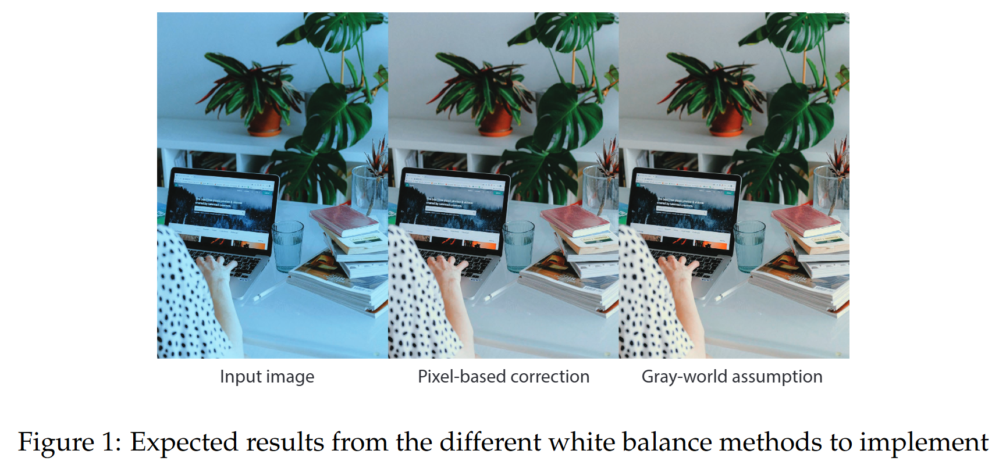

In [5]:
# Define your functions here

def average_gain(image,width,height):

    avg_red = 0
    avg_blue = 0
    avg_green = 0
    for i in range(width): 
        for j in range(height): 
            r, g, b = image.getpixel((i, j)) 
            avg_red += r
            avg_green += g
            avg_blue += b
    avg_red = avg_red / (width * height)
    avg_green = avg_green / (width * height)
    avg_blue = avg_blue / (width * height)
    total_avg = (avg_red + avg_green + avg_blue) / 3

    return avg_red,avg_green,avg_blue,total_avg

def per_pixel_correction(image,width,height,pixel_map,r_selected,g_selected,b_selected):
    
    for i in range(width): 
        for j in range(height): 
            r, g, b = image.getpixel((i, j)) 
            r *= ((r_selected+g_selected+b_selected) / 3) /r_selected
            g *= ((r_selected+g_selected+b_selected) / 3) /g_selected
            b *= ((r_selected+g_selected+b_selected) / 3) /b_selected
            pixel_map[i, j] = (int(r), int(g), int(b)) 

    return image

def gray_world_assumption(image,width,height,pixel_map):

    avg_red,avg_green,avg_blue,total_avg = average_gain(image,width,height)

    for i in range(width): 
        for j in range(height): 
            r, g, b = image.getpixel((i, j)) 
            r *= (total_avg / avg_red)
            g *= (total_avg / avg_green)
            b *= (total_avg / avg_blue)
            pixel_map[i, j] = (int(r), int(g), int(b)) 

    return image

In [6]:
# Execute your code here .- you can include comments in your code explaining the steps of your algorithm


###  <span style="color:orange"> _Report_ </span>
<span style="color:orange">_Report your results below. Include experiments with doing the transformations directly on the values of the input image
and the intensities, i.e., after applying inverse gamma correction. Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive._</span>


(-0.5, 1279.5, 1919.5, -0.5)

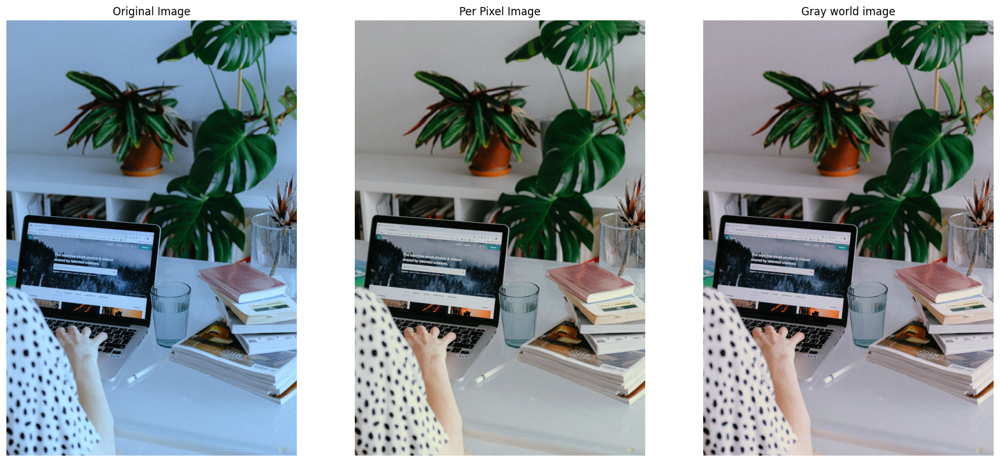

In [7]:
# Plotting code here
input_image = Image.open("white_balance_input.jpg") 

fig, axes = plt.subplots(1, 3, figsize=(20, 15))
axes[0].imshow(input_image)
axes[0].set_title("Original Image")
axes[0].axis("off")  

pixel_map = input_image.load() 
width, height = input_image.size 
r_selected, g_selected, b_selected = input_image.getpixel((472, 1514)) #this pixel was taken from a collegue with ginput function, its not random

per_pixel_image = per_pixel_correction(input_image,width,height,pixel_map,r_selected, g_selected, b_selected)

axes[1].imshow(per_pixel_image)
axes[1].set_title("Per Pixel Image")
axes[1].axis("off") 

gray_world_image = gray_world_assumption(input_image,width,height,pixel_map)

axes[2].imshow(gray_world_image)
axes[2].set_title("Gray world image")
axes[2].axis("off") 

As explained the objective is to find a per-channel gain which results in color-corrected images. We want to make sure that the image have natural-looking, it is possible to see that the input image is not very natural it tends to a blue tonality and we want to make it more like a normal picture. In order to do this we have two different ways :

__Pixel Based correction__

In order to compute a pixel based version of the image we firstly need to select a pixel that we are sure it's gray, once selected we retrieve its red,green and blue channels. Now in order to make sure that the image becomes somewhat natural we can multiply each channel of each pixel by the averge of the channels of the gray selected pixel divided by the value of the channel we are working on of the gray selected pixel. This mens that for the red we will be dividing the average by the red channel of the gray pixel etc..

Such procedure will balance the tonality of the image make it more real and removing the wrong tonalityit had before. We don't want any color to be dominating and given that a perfect gray pixel has all three channel that are the same, choosing a gray pixel is perfect to balance the image.

__Gray World ssumption__

Gray world ssumption is the second way for making such changes in the image. When dealing with this method the main difference between the pixel based one is that we don't need to select a specific gray pixel but instead we work directly with the full image averages. In this case we firstly calculate the avg(Red), avg(Green), Avg(Blue) of the __full image__ , and furthermore the total average of the three averages. Once we have this calculations we can multiply each pixel channel by the total avg of the image's channels divided by the corresponding channel average of the full image. I.e for the red channel of ech pixel we will be multiplying it by the total avg divided by the avg(Red). 


## 1.3 Histograms [2 points]

Histograms show the frequency of occurrence of different pixel intensity levels in the image. We can use
them to obtain exposure information (assessing whether an image has captured a sufficient amount of light).
Color histograms can also be used to manipulate images. For instance, if an image has too much blue, you
can adjust the histogram to reduce the amount of blue, by shifting the blue values towards the center of the
histogram, which will reduce its intensity in the image.

### _Task_

Implement a histogram plotter using basic operations (your OWN implementation) and
show the color histogram of the provided image. You will need to obtain the cumulative distribution of pixel values for each color channel and map them into a certain number of bins to display them.

In [8]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm
def compute_histogram(image,bins):
    width, height = image.size 
    histogram = {
        "R": [0] * bins, 
        "G": [0] * bins, 
        "B": [0] * bins
    }

    for y in range(height):
        for x in range(width):
            r, g, b = image.getpixel((x, y))
            histogram["R"][r] += 1
            histogram["G"][g] += 1
            histogram["B"][b] += 1

    total_pixels = height * width
    for key in histogram:
        histogram[key] = [val / total_pixels for val in histogram[key]]

    return histogram


def plot_histogram(hist):
    colors = {
        "R": "red",
        "G": "green", 
        "B": "blue"
    }

    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    for key in hist:
        plt.plot(hist[key], color=colors[key], label=f"{key} Histogram")
    plt.title("Normalized Histogram")
    plt.xlabel("Intensity")
    plt.ylabel("Number of Pixels")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [9]:
# Execute your code here

###  <span style="color:orange"> _Report_ </span>
<span style="color:orange">_Report your results below. Include experiments with different images, and compute different histograms before and after performing some of the point operations implemented in 1.1. Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive._</span>

The histogram of an image is very helpful to understand the intensity distribution over the image. From it is possible to see if there is too much or too little of some color and give us an idea of how to manipulate the image to make it better.

In order to compute the histogram, we can iterate through every pixel of the image and count the occurence of each intensity value for every channel, each intensity will then be mapped to each bin of the histogram. Such process gives us the possibility of effectively computing a histogram. Furthermore we normalize the histogram and we do such by dividing each bin count by the total number of pixel.

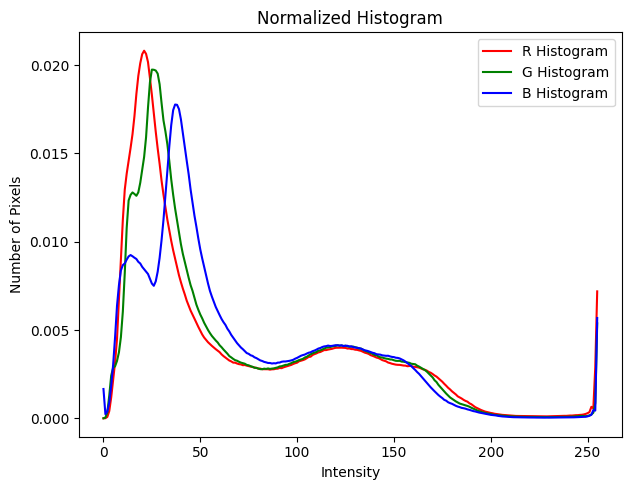

In [10]:
# Plotting code here
image = Image.open("ferrari.JPG").convert("RGB")
histogram = compute_histogram(image,256)
plot_histogram(histogram)

__Histogram of the normal image__

It is possible to see that the image has a lot of pixels below thevalue 70 which means that it tends to be  darker imge given that the majority of the pixels are close to dark intensities.

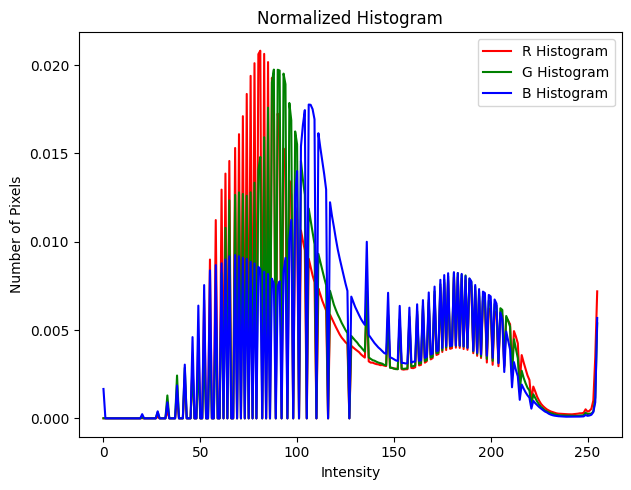

In [11]:
histogram_corrected = compute_histogram(Image.fromarray((corr_img * 255).astype(np.uint8)),256)
plot_histogram(histogram_corrected)

__Histogram of the gamma corrected image__

The gamma corrected image exemplifies of the bell curve moved slightly tothe right, this gives the possibility to brighten a bit the image and make it less dark.

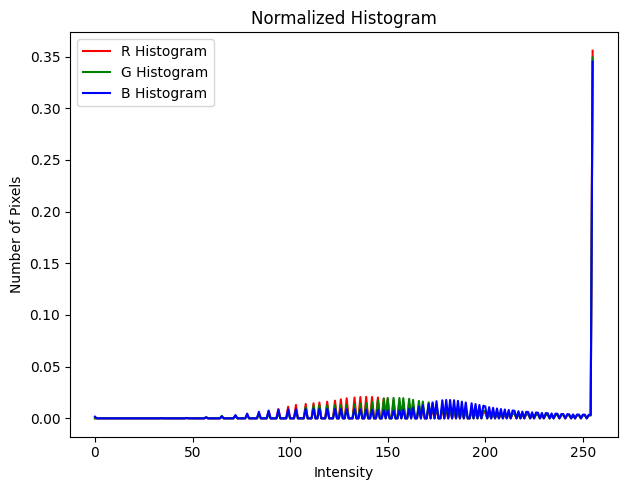

In [12]:
histogram_brighter = compute_histogram(Image.fromarray((brighter_img * 255).astype(np.uint8)),256)
plot_histogram(histogram_brighter)

__Histogrm of the brighter image__

In the histogramit is possible to see how the intensities are now far fromthe black intensities and tend to spread more towards the very bright ones. there are also some pixel very very bright, white and it is possible to see that in the imge above.

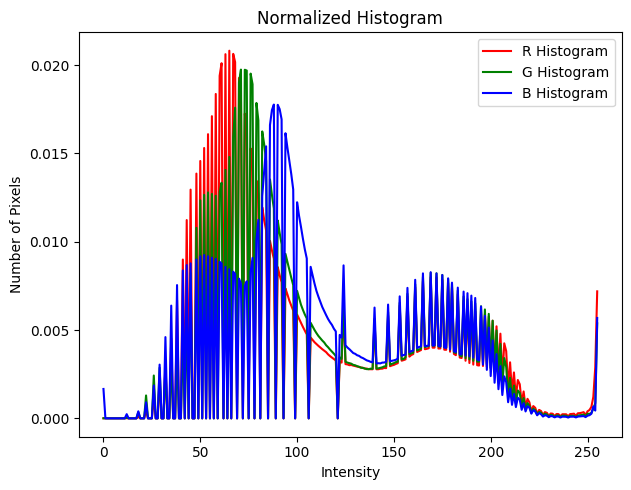

In [13]:
histogram_enhanced = compute_histogram(Image.fromarray((enhanced_img * 255).astype(np.uint8)),256)
plot_histogram(histogram_enhanced)

__Histogram of the contrast enhanced__

Here it is possible to see how the image is not as dark as the initial one but still has many dark areas, this is mostly due to the bigshadow in the image. It is possible to see though a good amount of brighter intensities which suggest the fact that the contrast is enhanced.

## 1.4 Histogram Equalization [7 points + 5 Bonus]

Another way of using histograms to manipulate images is through histogram equalization. By redistributing
pixel intensities across the image based on its histogram, we can improve its contrast.
There are several ways of performing histogram equalization:

* **Global** methods consist on calculating the cumulative distribution function of the histogram, normalizing it and then mapping each pixel in the image to their new normalized intensity.

* **Local** methods work on pre-defined windows across the image (think of cropped squares of a fixed
size), where a histogram is computed for each window and normalized using the previous method
independently.
* **Locally adaptive** methods use a moving window across the image instead of fixed-place boxes. Each
pixel value is then equalized according to the histogram of its small surrounding window, repeating
the task for every pixel in the image.

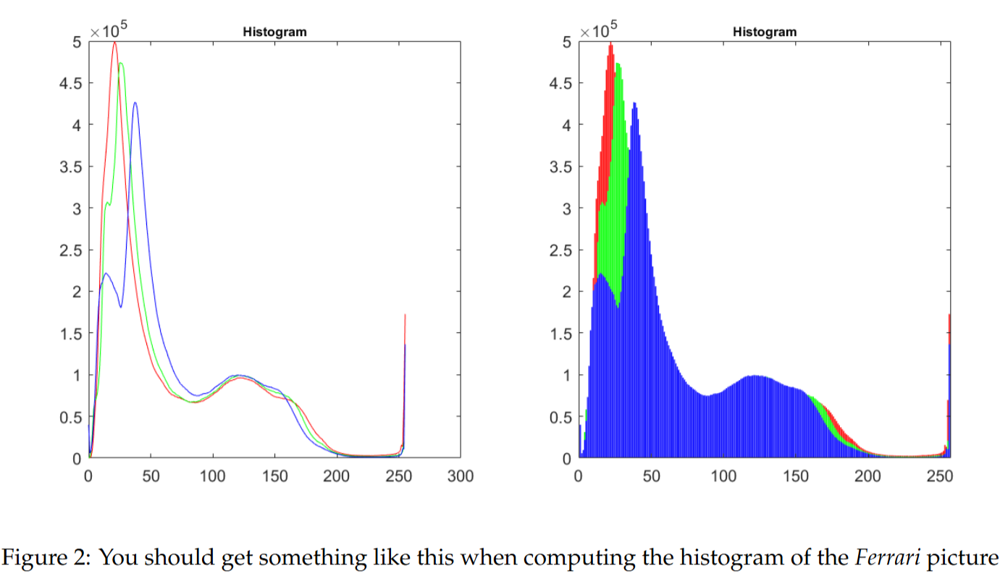

### _Task_

Implement global and local histogram equalization methods using basic functions (your
OWN implementation) and show the results of applying each to the same image. For local methods, you should try with different window sizes. Interpret these results and argue benefits and problems of each.

__Important Note.__ Running any kind of histogram equalization on each color channel separately will probably alter the colors in the image. Instead, you may use a stock Pillow/numpy/scipy function to convert the image to HSV or HSL color spaces and work only on the value/lightness axis. This will only alter brightness in the image and preserve color.

<span style="color:red">Bonus.</span> Implement a locally adaptive method based on the previous two.

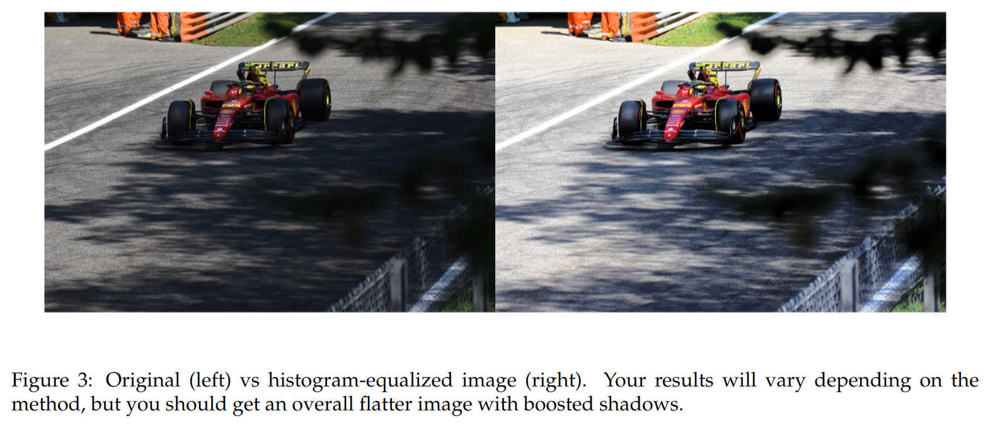

In [14]:
# Define your functions here.- you can include comments in your code explaining the steps of your algorithm

def compute_histogram_equalization(v_channel):
    v_channel = np.array(v_channel)  
    hist = np.zeros(256)
    total_pixels = v_channel.size  
    for pixel in v_channel.flatten():  
        hist[int(pixel)] += 1
    return hist / total_pixels

def compute_comulative_distribution_equalization(hist):
    cdf = [0] * len(hist)  
    cdf[0] = hist[0]  
    for i in range(1, len(hist)):
        cdf[i] = cdf[i - 1] + hist[i]  
    return cdf

def normalize_cdf(cdf):
    cdf_min = min(cdf)
    cdf_max = max(cdf)
    if cdf_max == cdf_min:
        return [0] * len(cdf)  
    return [int((val - cdf_min) * 255 / (cdf_max - cdf_min)) for val in cdf]


def global_histogram_equalization(h, s, v):    

    hist = compute_histogram_equalization(v) 
    cdf = compute_comulative_distribution_equalization(hist)   
    cdf = normalize_cdf(cdf)

    v_equalized = np.zeros_like(v, dtype=np.uint8)
    height, width = v.shape
    for i in range(height):
        for j in range(width):
            v_equalized[i, j] = cdf[v[i, j]]
    
    return v_equalized


def local_histogram_equalization(image_hsv, window_size=8):
    image_hsv = np.array(image_hsv)
    height, width, _ = image_hsv.shape
    hsv_image_equalized = np.zeros_like(image_hsv)
    for i in range(0, height, window_size):
        for j in range(0, width, window_size):
            window = image_hsv[i:i+window_size, j:j+window_size, :]
            h, s, v = window[..., 0], window[..., 1], window[..., 2]
            v_equalized = global_histogram_equalization(h, s, v)

            hsv_image_equalized[i:i+window_size, j:j+window_size, 0] = h
            hsv_image_equalized[i:i+window_size, j:j+window_size, 1] = s
            hsv_image_equalized[i:i+window_size, j:j+window_size, 2] = v_equalized

    return hsv_image_equalized 


In [15]:
# Load image
image = Image.open("ferrari.JPG").convert("RGB")
hsv_image = image.convert("HSV")
hsv_image = np.array(hsv_image)
h, s, v = hsv_image[..., 0], hsv_image[..., 1], hsv_image[..., 2]

# Perform global histogram equalization on the V channel
v_equalized = global_histogram_equalization(h, s, v)

# Rebuild the HSV image with the equalized V channel
equalized_hsv = np.stack((h, s, v_equalized), axis=-1)

# Convert the HSV image back to RGB
equalized_hsv_image = Image.fromarray(equalized_hsv.astype(np.uint8), mode="HSV")
equalized_rgb = equalized_hsv_image.convert("RGB")

In [16]:
# Execute your code here
# Load image
image = Image.open("ferrari.JPG").convert("RGB")
image_hsv = image.convert('HSV')

# Apply local histogram equalization
equalized_image_local = local_histogram_equalization(image_hsv, 256)

# Convert back to RGB for visualization
rgb_image_local_equalization = Image.fromarray(equalized_image_local, mode='HSV').convert('RGB')



###  <span style="color:orange"> _Report_ </span>
<span style="color:orange">_Report your results below. Include experiments with different window sizes, and compare between all methods on the same images. Show their impact on their histograms and interpret it as well. Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive._</span>

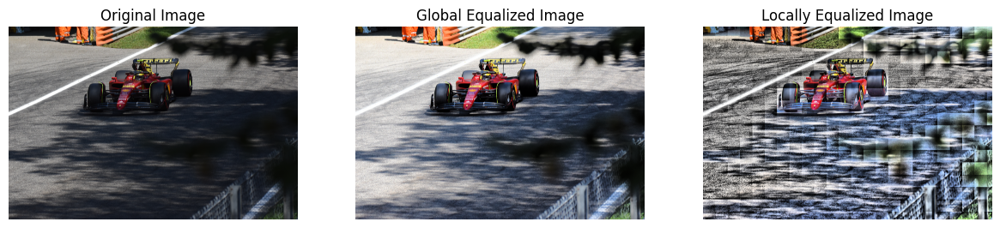

In [17]:
# Plotting code here
plt.figure(figsize=(20, 10))

plt.subplot(1, 4, 1)
plt.imshow(image)
plt.axis('off')
plt.title("Original Image")

# Plotting Global Equalized Image
plt.subplot(1, 4, 2)
plt.imshow(equalized_rgb)
plt.axis('off')
plt.title("Global Equalized Image")

# Plotting Locally Equalized Image
plt.subplot(1, 4, 3)
plt.imshow(rgb_image_local_equalization)
plt.axis('off')
plt.title("Locally Equalized Image")

plt.show()

When dealing with histogram equalization, it means that we are trying to improve the contrast of the image. Histogram equalization tends to make histogram more spread out.

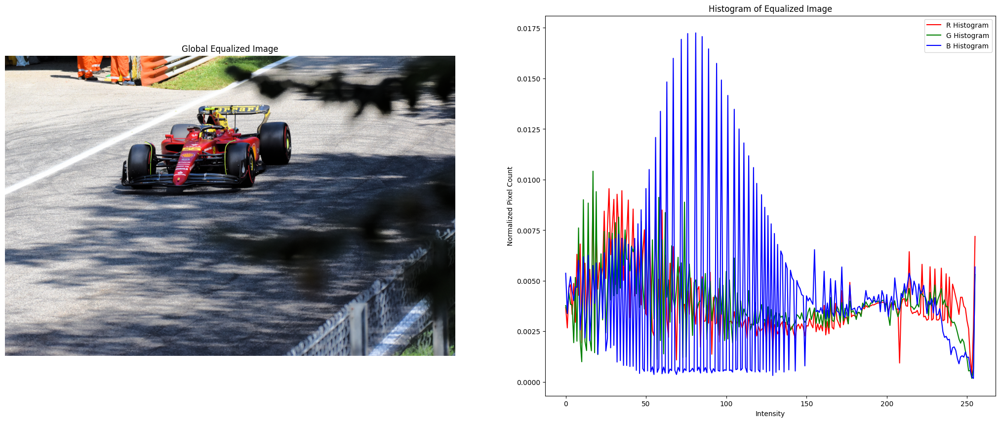

In [18]:
plt.figure(figsize=(40, 10))

plt.subplot(1, 3, 1)
plt.imshow(equalized_rgb)
plt.axis('off')
plt.title("Global Equalized Image")

plt.subplot(1, 3, 2)
hist_eq = compute_histogram(equalized_rgb, 256)
plt.plot(hist_eq["R"], color="red", label="R Histogram")
plt.plot(hist_eq["G"], color="green", label="G Histogram")
plt.plot(hist_eq["B"], color="blue", label="B Histogram")
plt.title("Histogram of Equalized Image")
plt.xlabel("Intensity")
plt.ylabel("Normalized Pixel Count")
plt.legend()

plt.show()

__Global Equalization__

When dealing with global equalization in our case we are working with HSV images in order to preserve the colors of the image. Mainly we workon the v channel. What we do initially is calculating the normalized histogram of the v channel, once calculated the histogram we calculate its cumulative distribution by iterating through the histogramand summing the values progressively. Calculating the cdf help us redistributing pixel intensities across the full range which leads to a more balanced contrast. In order to make sure a good spread across all intensities is made, we need to normalize the cdf and we do such by finding the min and max values of the cdf and apply the following formula to every cdf value: 

$$
\text{normalized CDF} = \frac{(\text{CDF} - \text{CDF}_{\min}) \times 255}{\text{CDF}_{\max} - \text{CDF}_{\min}}
$$

To end the global process we need to equalize the v channel of every pixel sowe iterate over all the pixels and map their intensitiesto the new equalized one.

Inthe histogramit is possible to see that mainly the image got brighter nd is more balanced, obviously still ther are some dark areas that make the histograms still having some few more intensities on that side.


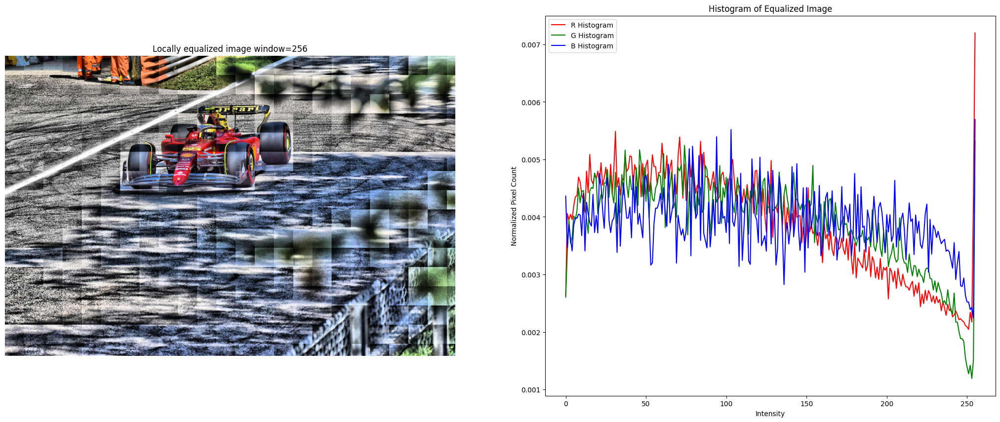

In [19]:
plt.figure(figsize=(40, 10))

plt.subplot(1, 3, 1)
plt.imshow(rgb_image_local_equalization)
plt.axis('off')
plt.title("Locally equalized image window=256")

plt.subplot(1, 3, 2)
hist_eq = compute_histogram(rgb_image_local_equalization, 256)
plt.plot(hist_eq["R"], color="red", label="R Histogram")
plt.plot(hist_eq["G"], color="green", label="G Histogram")
plt.plot(hist_eq["B"], color="blue", label="B Histogram")
plt.title("Histogram of Equalized Image")
plt.xlabel("Intensity")
plt.ylabel("Normalized Pixel Count")
plt.legend()

plt.show()

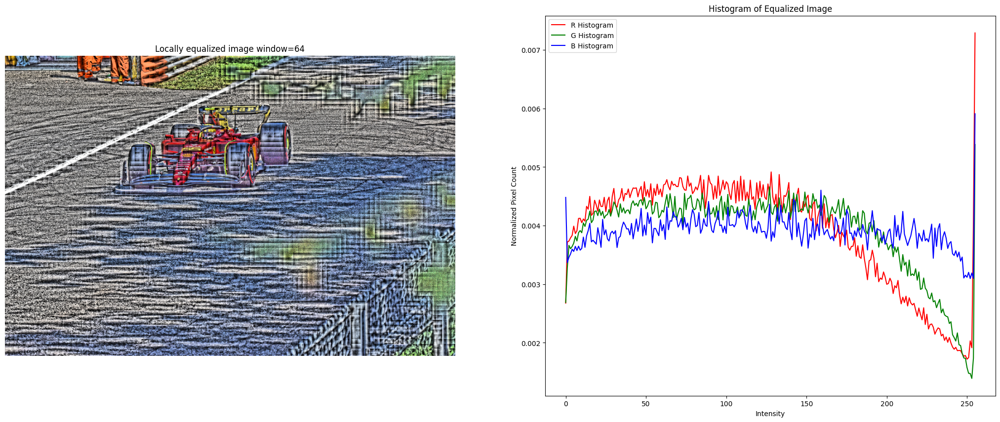

In [20]:
plt.figure(figsize=(40, 10))

plt.subplot(1, 3, 1)
plt.imshow(Image.fromarray(local_histogram_equalization(image_hsv, 64), mode='HSV').convert('RGB'))
plt.axis('off')
plt.title("Locally equalized image window=64")

plt.subplot(1, 3, 2)
hist_eq = compute_histogram(Image.fromarray(local_histogram_equalization(image_hsv, 64), mode='HSV').convert('RGB'), 256)
plt.plot(hist_eq["R"], color="red", label="R Histogram")
plt.plot(hist_eq["G"], color="green", label="G Histogram")
plt.plot(hist_eq["B"], color="blue", label="B Histogram")
plt.title("Histogram of Equalized Image")
plt.xlabel("Intensity")
plt.ylabel("Normalized Pixel Count")
plt.legend()

plt.show()

__Local Equalization__

When dealing with global equalization in our case we are working with HSV images in order to preserve the colors of the image. Mainly we workon the v channel. When working with the local equalization as the name says we are applying changes locally so we choose a specific window size and we equalize each smaller window. So what the implementation effectively does is applying global equalization onto each smaller windows. This ends in creating an image with very high edge contrast effectively clearly showing the boxes created while apllying locally the changes. 

In this case the histogram looks very balanced, very muchmore prompted to being flat, though, the squares on the image are relly not what we would like in an image 

## 1.5 Matting [5 points]

Another basic operation in image processing is matting. In its simplest form, image pixels are filtered using
a threshold which results in a mask or matte. This mask is used to isolate a specific object in the image, so
that we can either place it in another image or simply change its background. Although recently, semantic
classification of pixels through machine learning or deep learning methods have obsoleted classic techniques
such as chroma keys (selecting matte masks according to color backgrounds), it is still a powerful and cheap
tool for matting.

### _Task_

Implement a function to filter (threshold) the provided image based on the color background to obtain a mask, which will then be used to replace this background with a different image of your choice.

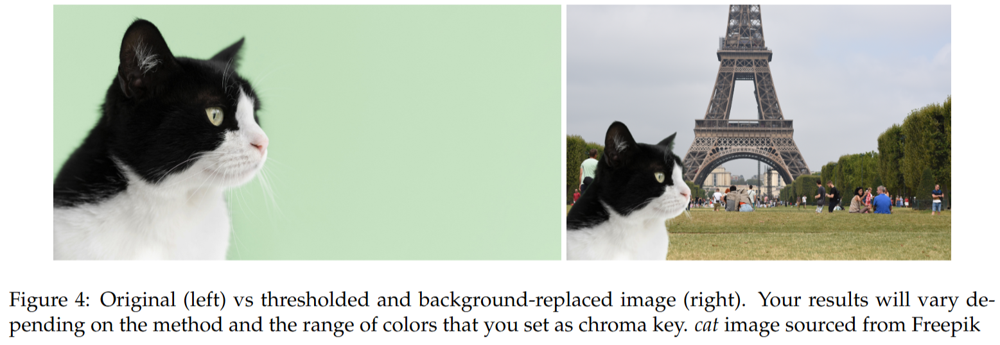

In [2]:
def matting(foreground_image,background_image):

    # foreground
    foreground = Image.open(foreground_image).convert("RGB")
    foreground = np.array(foreground) / 255.0  

    n_rows, n_cols, _ = foreground.shape  

    # Extract RGB channels
    R = foreground[:, :, 0]
    G = foreground[:, :, 1]
    B = foreground[:, :, 2]

    # Define threshold for background removal (assuming a green screen)
    threshold = 0.05  
    alpha = (G > R + threshold) & (G > B + threshold)  
    alpha = alpha.astype(float)  
    
    # background
    background = Image.open(background_image).convert("RGB")
    background = background.resize((n_cols, n_rows))  
    background = np.array(background) / 255.0 

    result = (1 - alpha[:, :, None]) * foreground + alpha[:, :, None] * background

    result = np.clip(result, 0, 1)

    return result,alpha



###  <span style="color:orange"> _Report_ </span>
<span style="color:orange">Report your results below. Include tests with different foreground and background images. Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive. </span>

In this case what we want to do is creating a mask or a matte from an image which we will then be able to reuse. Creating this mask means effectively isolate a part of a picture so that it canbe reused or hebackground canbe changed as in our case.

The implementation works in the following way : First we retrieve the mask and then we load the background, in order to "merge" the two images we can use the formula that is onthe slides that is 

$$
f[i, j] = (1 − α[i, j]) \cdot f_1[i, j] + α[i, j] \cdot f_2[i, j]
$$

To retrieve the mask we first retrieve the Red,green and blue channel of the foreground image, then we check for each pixel if the pixel is as green as we defined it to be, which means it is in a ceratin range stronger than red and blue and in between a certain threshold than it is categorized as background otherwise as foreground. What just explains gives us away to perfectly detect background and forground. The threshold hyperparameter is very important because based on that we are able to perfectly divide the two.

The following shows the mask that was found for the cat foreground image:

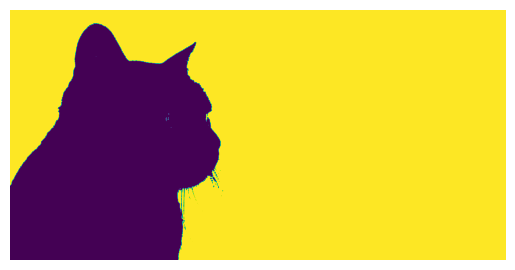

In [22]:
_, alpha = matting('cat.jpg','eiffel.jpg')
plt.imshow(alpha)
plt.axis("off")
plt.show()

Now it is to compute the image with a different background as in the example with the eiffel tower inthe background, in order to merge the two pictures we cn simply follow the two images by following the formula writtend above which just does the following:

Whenever $$  α[i, j] $$ is equal to 0 then the pixel is fully foreground so a pixel ofthe cat will be displayed when instead it is 1 it is background sothe eiffel tower will be displayed.

So the following representedthe image with the bckground changed:

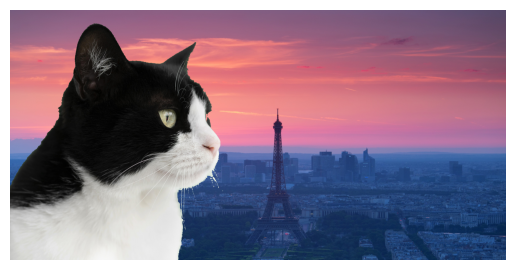

In [23]:
matted_image,_ = matting('cat.jpg','eiffel.jpg')
plt.imshow(matted_image)
plt.axis("off")
plt.show()

Another example with another background

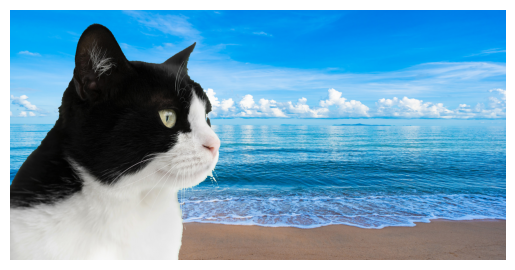

In [24]:
matted_image,_ = matting('cat.jpg','sea.jpg')
plt.imshow(matted_image)
plt.axis("off")
plt.show()

Another example with another foreground

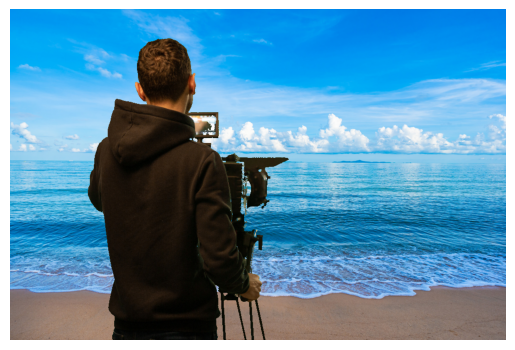

In [5]:
matted_image,_ = matting('man1.jpg','sea.jpg')
plt.imshow(matted_image)
plt.axis("off")
plt.show()